In [1]:
import os, re
import random, math
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

c:\Users\Desk_Kang\anaconda3\envs\pyenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
(raw_train, raw_val, raw_test), info = tfds.load('tf_flowers', split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'], download=True, with_info=True)

In [3]:
#사진 데이터 불러와서 train, validation, test 로 나누어 저장함

In [4]:
print(raw_train)
print(raw_val)
print(raw_test)

<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>


In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


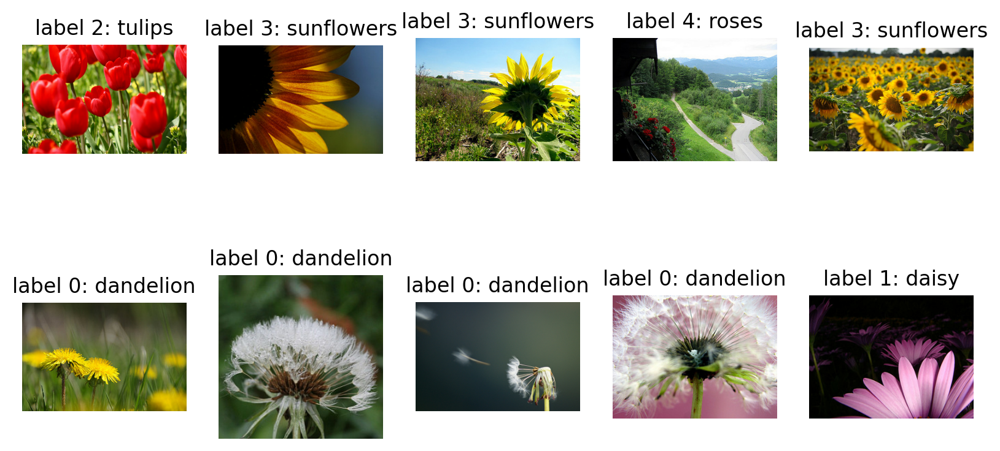

In [6]:
plt.figure(figsize=(10, 5))

get_label_name = info.features['label'].int2str

for idx, data in enumerate(raw_train.take(10)):
    image = data['image']
    label = data['label']

    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

plt.show()

In [7]:
IMG_SIZE = 220 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5)-1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label


In [8]:
#이미지 픽셀의 데이터는 0~255 숫자를 가지고 있어 /255 혹은 (/127.5)-1 스케일링함
#여기서는 후자 선택

In [9]:
train = raw_train.map(lambda x: format_example(x['image'], x['label']))
validation = raw_val.map(lambda x: format_example(x['image'], x['label']))
test = raw_test.map(lambda x: format_example(x['image'], x['label']))

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [10]:
#데이터와 라벨링 작업

In [11]:
print(len(train))
print(len(test))
print(len(validation))

2936
367
367


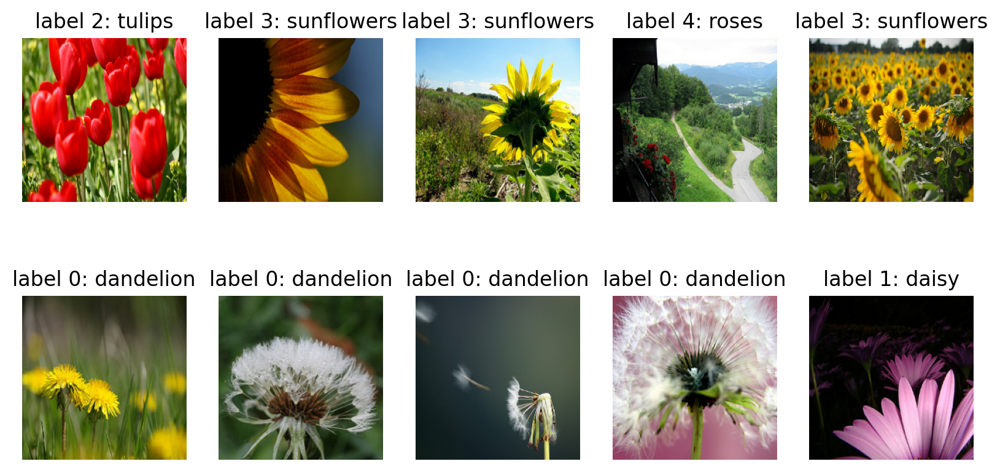

In [12]:
plt.figure(figsize=(10, 5))


get_label_name = info.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [13]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [22]:
BATCH_SIZE = 32
# SHUFFLE_BUFFER_SIZE_T = 1050
SHUFFLE_BUFFER_SIZE_A = 120

In [15]:
#shuffle buffer size가 원 데이터의 10%~100%가 적당하다는데
#pneu에서는 훨씬 큰 숫자를 줘야 했음
#여기선 30%정도 부여

In [16]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
# 데이터 로드할 때 빠르게 로드할 수 있도록하는 설정 변수

In [17]:
def augment(image,label):
    image = tf.image.random_flip_left_right(image)  # 랜덤하게 좌우를 반전합니다.
    return image,label

In [36]:
#데이터 파이프라인
#shuffle 무작위 요소 선택
#repeat 여러번 데이터셋을 사용할 수 있게 만듬
#batch 배치사이즈에 맞게 데이터 나눔

def prepare_for_training(ds, shuffle_buffer_size):
    # augment 적용 부분이 배치처리 함수에 추가되었습니다.
    ds = ds.map(
            augment,       # augment 함수 적용(좌우반전)
            num_parallel_calls=2
        )
    ds = ds.shuffle(buffer_size=shuffle_buffer_size)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

train_ds = prepare_for_training(train, 1050)
val_ds = prepare_for_training(validation, 120)

In [37]:
# train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE_T).batch(BATCH_SIZE)
# validation_batches = validation.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)
test_batches = test.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)

In [38]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 220, 220, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 220, 220, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 220, 220, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 110, 110, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 110, 110, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 110, 110, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 55, 55, 128)       0     

In [39]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [40]:
dense_layer = tf.keras.layers.Dense(1024, activation='relu')
dropout_layer = tf.keras.layers.Dropout(0.3)
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
dense_layer3 = tf.keras.layers.Dense(512, activation='relu')

In [41]:
#layer를 더 쌓으면 학습데이터에 맞출 수 있을까 해서
#3개 쌓아봄

In [42]:
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

In [43]:
base_model.trainable = False

In [44]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dropout_layer,
  dense_layer2,
  dense_layer3,
  prediction_layer
])

In [45]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 6, 6, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 1024)              525312    
                                                                 
 dropout_1 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 512)               524800    
                                                                 
 dense_6 (Dense)             (None, 512)               262656    
                                                      

In [46]:
learning_rate = 0.0001
EPOCHS = 35
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [47]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("flowers_model.h5",
                                                    save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=5,
                                                     restore_best_weights=True)

In [48]:
history = model.fit(train_ds,
                    epochs=EPOCHS,
                    validation_data=val_ds,
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/35
92/92 [==============================] - 29s 196ms/step - loss: 1.2738 - accuracy: 0.5174 - val_loss: 0.9194 - val_accuracy: 0.6812
Epoch 2/35
92/92 [==============================] - 11s 115ms/step - loss: 0.8345 - accuracy: 0.6955 - val_loss: 0.6984 - val_accuracy: 0.7657
Epoch 3/35
92/92 [==============================] - 11s 117ms/step - loss: 0.7108 - accuracy: 0.7394 - val_loss: 0.6447 - val_accuracy: 0.7657
Epoch 4/35
92/92 [==============================] - 11s 113ms/step - loss: 0.6341 - accuracy: 0.7646 - val_loss: 0.7148 - val_accuracy: 0.7439
Epoch 5/35
92/92 [==============================] - 11s 116ms/step - loss: 0.5842 - accuracy: 0.7854 - val_loss: 0.5579 - val_accuracy: 0.7984
Epoch 6/35
92/92 [==============================] - 11s 121ms/step - loss: 0.5436 - accuracy: 0.8048 - val_loss: 0.5809 - val_accuracy: 0.8093
Epoch 7/35
92/92 [==============================] - 12s 124ms/step - loss: 0.5156 - accuracy: 0.8127 - val_loss: 0.5148 - val_accuracy: 0.8147

In [49]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 203ms/step


array([[9.53296985e-05, 6.30612631e-05, 1.73711385e-06, 9.99837875e-01,
        1.86180876e-06],
       [9.94554877e-01, 4.99229645e-03, 4.16918701e-05, 2.84253561e-04,
        1.26914922e-04],
       [6.44678948e-05, 9.40844184e-05, 5.07206395e-02, 2.09073871e-04,
        9.48911786e-01],
       [2.14230060e-03, 9.94003236e-01, 1.40969074e-04, 3.68840573e-03,
        2.51190140e-05],
       [2.86797583e-02, 1.75812170e-02, 9.29648519e-01, 4.07623174e-03,
        2.00142656e-02],
       [1.94676127e-02, 6.46203160e-02, 3.26974899e-01, 3.22774619e-01,
        2.66162485e-01],
       [1.22537166e-01, 7.28122056e-01, 8.55706539e-03, 1.40627459e-01,
        1.56356997e-04],
       [2.66805410e-01, 3.17350999e-02, 1.05329435e-02, 6.41637146e-01,
        4.92894575e-02],
       [1.04127035e-01, 8.42819512e-01, 3.91097798e-04, 5.20145968e-02,
        6.47736713e-04],
       [9.99462306e-01, 1.55218368e-04, 2.76444898e-05, 2.96845945e-04,
        5.80768065e-05],
       [9.98381972e-01, 1.0044

In [50]:
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 4, 1, 2, 2, 1, 3, 1, 0, 0, 2, 0, 3, 2, 2, 2, 4, 0, 2, 2, 1,
       4, 2, 1, 2, 3, 3, 0, 1, 0, 2], dtype=int64)

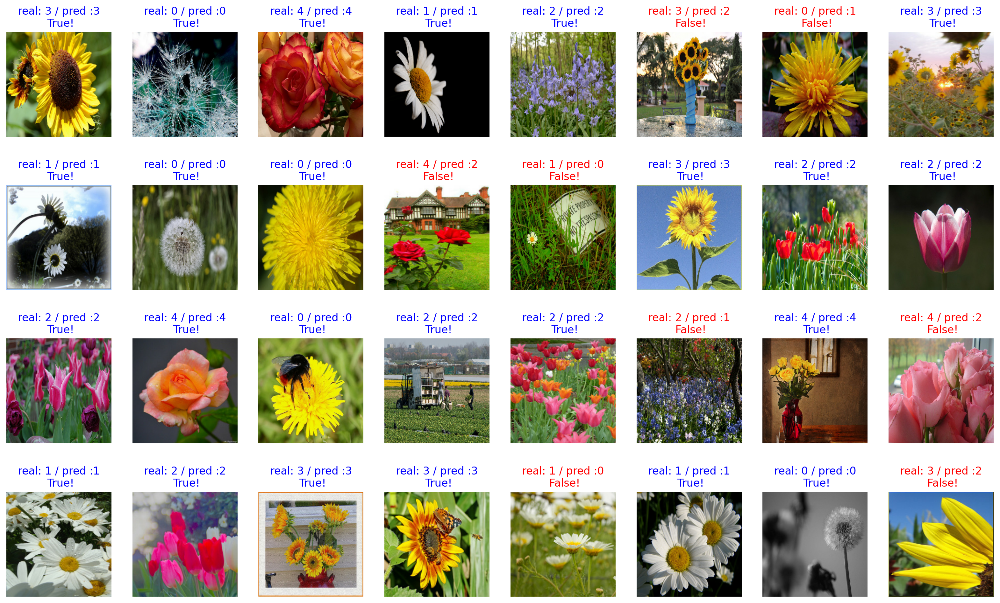

In [51]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [52]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

75.0


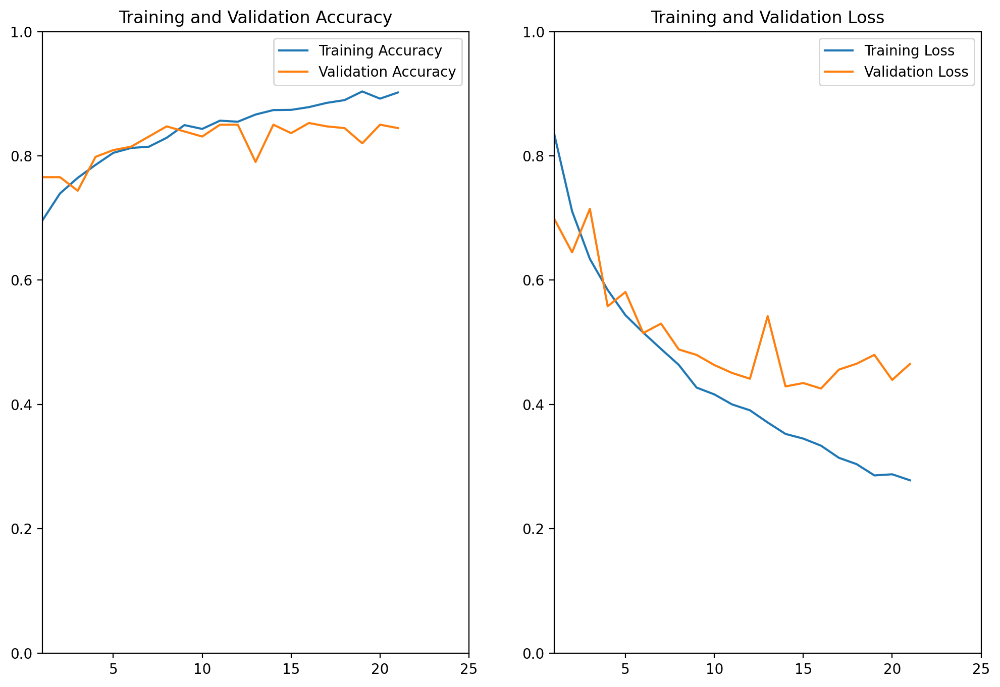

In [54]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(22)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.show()

In [55]:
test_loss, test_accuracy = model.evaluate(test_batches)

12/12 [==============================] - 2s 114ms/step - loss: 0.3902 - accuracy: 0.8556


In [56]:
print(f'Loss: {test_loss},\nAccuracy: {test_accuracy}')

Loss: 0.39023593068122864,
Accuracy: 0.8555858135223389


In [ ]:
#test_accuracy가 약 0.855으로 85% 정확도를 보여줌

In [ ]:
#여러 파라미터 중 Epoch은 10~35로 다양하게 나타나서 35까지 주고 다른 파라미터 변화를 줌
#dense_layer를 처음엔 512짜리 2개만 쌓았다가, flower에 더 치우치도록 3개와 dropdout까지 쌓아봄
#처음엔 shuffle buffer size를 train만 10% 줬는데, validation과 test까지 포함하여 30%까지 바꾸어봄
#생각보다 85% 넘기기가 힘들다는걸... 느낌
#학습 데이터 전처리에서 다양성을 주는 방법을 더 찾아보아야겠음(노드에서 좌우반전 회전을 배웠음)
